In [1]:
import json

# Specify the path to your JSON file
json_file_path_final_dict = '/Users/lukasjonsson/Desktop/DTU/Kandidat/3. semester/Social graphs & interactions/Project/socialGraphsProject/data/final_dict.json'

# Open the file and load its contents as a dictionary
with open(json_file_path_final_dict, 'r') as file:
    arc_dict = json.load(file)

In [2]:
arc_dict

{'Prologue_—_Land_of_Waves': [{'Episode Number': '1',
   'Episode Title': 'Enter:_Naruto_Uzumaki!',
   'Episode Description': "Twelve years ago, a vicious tailed beast known as the Nine-Tails attacked the shinobi village of Konohagakure. Many shinobi fought the beast but killed all those standing before it. The Fourth Hokage saved the town by sealing the beast with an infant boy at the cost of his own life.\n\nIn the present, Naruto Uzumaki is a prankster who is constantly causing trouble throughout Konohagakure, most recently having placed graffiti all over the Hokage Rock. Much of the village dislikes him, but he enjoys the attention garnered from reprimands, as he had no parents or friends due to the villagers abusing him daily. Despite claiming to be a talented shinobi who would someday become Hokage, Naruto cannot perform basic techniques such as the Clone Technique. When this leaves him unable to graduate from the Academy, one of his instructors, Mizuki, tells Naruto that if he c

In [3]:
# Assuming 'final_dict' is your existing sorted and updated data structure

# Create a new dictionary for the final result with combined Episode Descriptions
final_dict_with_combined_descriptions = {}

# Iterate through arcs in the sorted and updated data structure
for arc_name, episodes in arc_dict.items():
    # Combine Episode Descriptions into a single string for each arc
    combined_description = ' '.join(str(episode.get('Episode Description', '')) for episode in episodes)
    final_dict_with_combined_descriptions[arc_name] = combined_description

# Print the final result with combined Episode Descriptions
for arc_name, combined_description in final_dict_with_combined_descriptions.items():
    print(f"Arc: {arc_name}")
    print(f"Combined Description: {combined_description}")
    print()

# If you want to save the final result to a file (e.g., final_dict_combined_descriptions.json)
#with open('final_dict_combined_descriptions.json', 'w') as file:
#    json.dump(final_dict_with_combined_descriptions, file, indent=2)


Arc: Prologue_—_Land_of_Waves
Combined Description: Twelve years ago, a vicious tailed beast known as the Nine-Tails attacked the shinobi village of Konohagakure. Many shinobi fought the beast but killed all those standing before it. The Fourth Hokage saved the town by sealing the beast with an infant boy at the cost of his own life.

In the present, Naruto Uzumaki is a prankster who is constantly causing trouble throughout Konohagakure, most recently having placed graffiti all over the Hokage Rock. Much of the village dislikes him, but he enjoys the attention garnered from reprimands, as he had no parents or friends due to the villagers abusing him daily. Despite claiming to be a talented shinobi who would someday become Hokage, Naruto cannot perform basic techniques such as the Clone Technique. When this leaves him unable to graduate from the Academy, one of his instructors, Mizuki, tells Naruto that if he could steal the Scroll of Seals and learn one of its secret techniques, he wou

In [4]:
final_dict_with_combined_descriptions

{'Prologue_—_Land_of_Waves': 'Twelve years ago, a vicious tailed beast known as the Nine-Tails attacked the shinobi village of Konohagakure. Many shinobi fought the beast but killed all those standing before it. The Fourth Hokage saved the town by sealing the beast with an infant boy at the cost of his own life.\n\nIn the present, Naruto Uzumaki is a prankster who is constantly causing trouble throughout Konohagakure, most recently having placed graffiti all over the Hokage Rock. Much of the village dislikes him, but he enjoys the attention garnered from reprimands, as he had no parents or friends due to the villagers abusing him daily. Despite claiming to be a talented shinobi who would someday become Hokage, Naruto cannot perform basic techniques such as the Clone Technique. When this leaves him unable to graduate from the Academy, one of his instructors, Mizuki, tells Naruto that if he could steal the Scroll of Seals and learn one of its secret techniques, he would be allowed to con

In [5]:
# Defining a function to read the labMT_wordlist file and creating a dictionary for each word and their sentiment scores:
def load_labmt_wordlist(file_path):
    word_scores = {}  
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines:  
            parts = line.strip().split('\t')
            if len(parts) >= 3 and parts[0] != "word":  
                word = parts[0]
                score = float(parts[2]) if parts[2] != '--' else 5.0
                word_scores[word] = score
    return word_scores

labmt_wordlist_file = '/Users/lukasjonsson/Desktop/DTU/Kandidat/3. semester/Social graphs & interactions/Project/socialGraphsProject/LabMT_wordlist.txt' # Name has been anonymized
labmt = load_labmt_wordlist(labmt_wordlist_file)

In [6]:
def calculate_sentiment(tokens, wordlist, word_scores):
    sentiment_scores = [word_scores.loc[token, 'happiness_average'] for token in tokens if token in wordlist]
    
    if sentiment_scores:
        average_sentiment = sum(sentiment_scores) / len(sentiment_scores)
        return average_sentiment
    else:
        return None  # Return None if no valid tokens found


In [7]:
from nltk.tokenize import word_tokenize

# Assuming 'final_dict_with_combined_descriptions' is your dictionary with combined Episode Descriptions
# Assuming 'labmt' is your LabMT wordlist dictionary

# Create a dictionary to store sentiment scores for each arc
sentiment_scores = {}

# Define a function to calculate the sentiment score
def calculate_sentiment(description, word_scores):
    tokens = word_tokenize(description.lower())  # Tokenize and lowercase
    sentiment_scores = [word_scores.get(token, 0) for token in tokens]
    
    if sentiment_scores:
        average_sentiment = sum(sentiment_scores) / len(sentiment_scores)
        return average_sentiment
    else:
        return None  # Return None if no valid tokens found

# Iterate through arcs in the dictionary
for arc_name, combined_description in final_dict_with_combined_descriptions.items():
    # Calculate sentiment score based on LabMT wordlist
    sentiment_scores[arc_name] = calculate_sentiment(combined_description, labmt)

# Print or use the sentiment scores as needed
for arc_name, score in sentiment_scores.items():
    print(f"Arc: {arc_name}, Sentiment Score: {score}")

# If you want to save the sentiment scores to a file (e.g., sentiment_scores.json)
with open('sentiment_scores.json', 'w') as file:
    json.dump(sentiment_scores, file)


Arc: Prologue_—_Land_of_Waves, Sentiment Score: 3.7217865137101307
Arc: Chūnin_Exams_(Arc), Sentiment Score: 3.765166729821944
Arc: Konoha_Crush_(Arc), Sentiment Score: 3.619016583108351
Arc: Search_for_Tsunade, Sentiment Score: 3.8278689704823483
Arc: Land_of_Tea_Escort_Mission, Sentiment Score: 3.7298565121412697
Arc: Sasuke_Recovery_Mission, Sentiment Score: 3.781496681415932
Arc: Land_of_Rice_Fields_Investigation_Mission, Sentiment Score: 3.7689562043795455
Arc: Mizuki_Tracking_Mission, Sentiment Score: 3.6603865979381385
Arc: Bikōchū_Search_Mission, Sentiment Score: 3.6211777301927235
Arc: Kurosuki_Family_Removal_Mission, Sentiment Score: 3.8161892901618906
Arc: Gosunkugi_Capture_Mission, Sentiment Score: 4.028000000000001
Arc: Cursed_Warrior_Extermination_Mission, Sentiment Score: 3.638318452380952
Arc: Kaima_Capture_Mission, Sentiment Score: 3.603946731234865
Arc: Buried_Gold_Excavation_Mission, Sentiment Score: 3.9196575342465785
Arc: Star_Guard_Mission, Sentiment Score: 3.8304

In [8]:
max(sentiment_scores)

'Yakumo_Kurama_Rescue_Mission'

In [9]:
# Assuming 'sentiment_scores' is your dictionary with arc names and scores

# Find the arc with the maximum sentiment score
max_arc = max(sentiment_scores, key=sentiment_scores.get)
max_score = sentiment_scores[max_arc]

# Find the arc with the minimum sentiment score
min_arc = min(sentiment_scores, key=sentiment_scores.get)
min_score = sentiment_scores[min_arc]

# Print or use the max and min sentiment scores
print(f"Max Sentiment: Arc: {max_arc}, Score: {max_score}")
print(f"Min Sentiment: Arc: {min_arc}, Score: {min_score}")

# If you want to save the max and min sentiment scores to a file (e.g., max_min_sentiment.json)
# with open('max_min_sentiment.json', 'w') as file:
#     json.dump({'max': {'arc': max_arc, 'score': max_score}, 'min': {'arc': min_arc, 'score': min_score}}, file, indent=2)


Max Sentiment: Arc: Third_Great_Beast_Arc, Score: 4.058706293706296
Min Sentiment: Arc: Time_Slip_Arc, Score: 3.4654659389528697


In [10]:
import pandas as pd

# Assuming 'sentiment_scores' is your dictionary with arc names and scores
sentiment_df = pd.DataFrame(list(sentiment_scores.items()), columns=['Arc', 'Sentiment Score'])

# Print or use the DataFrame as needed
print(sentiment_df)


                                   Arc  Sentiment Score
0             Prologue_—_Land_of_Waves         3.721787
1                   Chūnin_Exams_(Arc)         3.765167
2                   Konoha_Crush_(Arc)         3.619017
3                   Search_for_Tsunade         3.827869
4           Land_of_Tea_Escort_Mission         3.729857
..                                 ...              ...
70  Great_Sea_Battle_of_Kirigakure_Arc         3.643513
71       Kawaki_&_Himawari_Academy_Arc         3.771536
72                  Labyrinth_Game_Arc         3.833274
73                 Sasuke_Retsuden_Arc         3.688049
74                  Code's_Assault_Arc         3.620747

[75 rows x 2 columns]


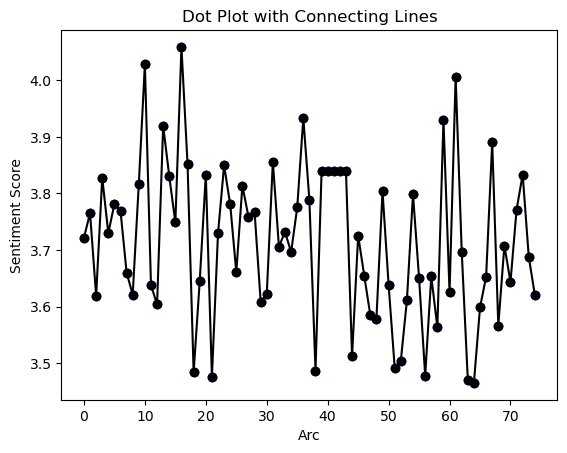

In [11]:
import matplotlib.pyplot as plt

# Create a dot plot
plt.scatter(sentiment_df.index, sentiment_df['Sentiment Score'], label='Arcs', color='blue')

# Connect the dots with lines
plt.plot(sentiment_df.index, sentiment_df['Sentiment Score'], linestyle='-', marker='o', color='black')

# Set plot labels and title
plt.title('Dot Plot with Connecting Lines')
plt.xlabel('Arc')
plt.ylabel('Sentiment Score')

# Show the plot
plt.show()

In [12]:
happiest_arc = final_dict_with_combined_descriptions['Third_Great_Beast_Arc']

In [13]:
saddest_arc = final_dict_with_combined_descriptions['Time_Slip_Arc']

In [14]:
import re 
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import nltk

# Define a function to clean and preprocess text
def clean_and_preprocess_text(raw_text):
    # Remove Wikipedia markup, including '== ... ==' sections
    text = re.sub(r'\[\[(.*?)\]\]', '', raw_text)  # Remove internal links
    text = re.sub(r'<(.*?)>', '', text)  # Remove HTML tags
    text = re.sub(r'==[^=]*==', '', text)  # Remove '==' sections

    # Normalize whitespace
    text = ' '.join(text.split())

    # Tokenization
    tokens = nltk.word_tokenize(text)

    # Lowercasing
    tokens = [token.lower() for token in tokens]

    # Remove special characters and punctuation
    tokens = [re.sub(r'[^a-zA-Z0-9]', '', token) for token in tokens if token.isalnum()]

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]

    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    return tokens

# Process Happiest arc text
happiest_arc_text = []
cleaned_tokens = clean_and_preprocess_text(happiest_arc)
happiest_arc_text.extend(cleaned_tokens)

# Process Saddest arc text
saddest_arc_text = []
cleaned_tokens = clean_and_preprocess_text(saddest_arc)
saddest_arc_text.extend(cleaned_tokens)


In [15]:
from collections import Counter

# Calculate Term Frequency (TF) for each word in each coast
happiest_arc_text_tf = Counter(" ".join(happiest_arc_text).split())
saddest_arc_text_tf = Counter(" ".join(saddest_arc_text).split())

# Calculate Term Ratio (TR) for each word for each coast
happiest_arc_term_ratio = {}
saddest_arc_term_ratio = {}  # Fixed the variable name

# Constant c
c = 150

# Calculate Term Ratio for the happiest arc
for word in happiest_arc_text_tf:
    if word in saddest_arc_text_tf:
        happiest_arc_term_ratio[word] = happiest_arc_text_tf[word] / (saddest_arc_text_tf[word] + c)

# Calculate Term Ratio for the saddest arc
for word in saddest_arc_text_tf:
    if word in happiest_arc_term_ratio:
        saddest_arc_term_ratio[word] = saddest_arc_text_tf[word] / (happiest_arc_term_ratio[word] + c)


In [16]:
# Sort words by their TF-TR values for the East Coast
top_happiest_arc_words = sorted(happiest_arc_term_ratio.items(), key=lambda item: item[1], reverse=True)

# Sort words by their TF-TR values for the West Coast
top_saddest_arc_words = sorted(saddest_arc_term_ratio.items(), key=lambda item: item[1], reverse=True)

# Select the top 5 words for the East Coast
top_5_happiest_arc_words = top_happiest_arc_words[:5]

# Select the top 10 words for the West Coast
top_5_saddest_arc_words = top_saddest_arc_words[:5]


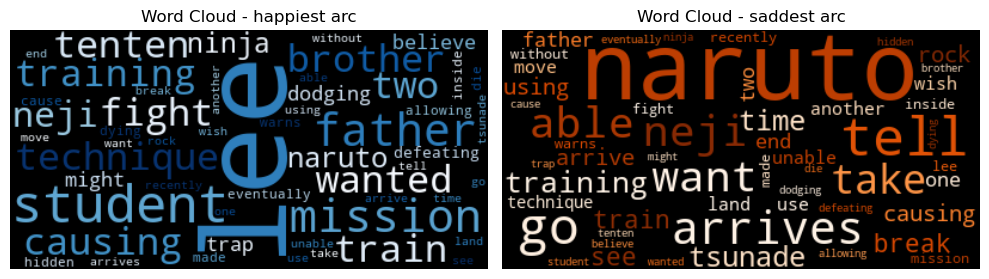

In [17]:
from wordcloud import WordCloud

# Create word clouds for both coasts with different color maps
def generate_word_cloud(top_words, title, colormap):
    word_weights = {word: frequency for word, frequency in top_words}
    wordcloud = WordCloud(width=400, height=200, background_color='black', colormap=colormap, collocations=False).generate_from_frequencies(word_weights)
    
    return wordcloud

# Set the figure size for both word clouds
plt.figure(figsize=(10, 5))

# Create subplots
plt.subplot(1, 2, 1)
wordcloud_east = generate_word_cloud(top_happiest_arc_words, "East Coast", "Blues")
plt.imshow(wordcloud_east, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud - happiest arc")
plt.gca().add_patch(plt.Rectangle((-2, -2), 404, 204, fill=False, edgecolor='black'))

plt.subplot(1, 2, 2)
wordcloud_west = generate_word_cloud(top_saddest_arc_words, "West Coast", "Oranges")
plt.imshow(wordcloud_west, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud - saddest arc")
plt.gca().add_patch(plt.Rectangle((-2, -2), 404, 204, fill=False, edgecolor='black'))

# Display the subplots side by side
plt.tight_layout()
plt.show()


## Season analysis

In [18]:
# Specify the path to your JSON file
json_file_path_season_desc = '/Users/lukasjonsson/Desktop/DTU/Kandidat/3. semester/Social graphs & interactions/Project/socialGraphsProject/data/episodes_seasons_descriptions.json'

# Open the file and load its contents as a dictionary
with open(json_file_path_season_desc, 'r') as file:
    season_desc_dict = json.load(file)

In [19]:
season_desc_dict

{'Naruto: Original': [{'Episode Number': '1',
   'Episode Title': 'Enter:_Naruto_Uzumaki!',
   'episode_synopsis_text': "Twelve years ago, a vicious tailed beast known as the Nine-Tails attacked the shinobi village of Konohagakure. Many shinobi fought the beast but killed all those standing before it. The Fourth Hokage saved the town by sealing the beast with an infant boy at the cost of his own life.\n\nIn the present, Naruto Uzumaki is a prankster who is constantly causing trouble throughout Konohagakure, most recently having placed graffiti all over the Hokage Rock. Much of the village dislikes him, but he enjoys the attention garnered from reprimands, as he had no parents or friends due to the villagers abusing him daily. Despite claiming to be a talented shinobi who would someday become Hokage, Naruto cannot perform basic techniques such as the Clone Technique. When this leaves him unable to graduate from the Academy, one of his instructors, Mizuki, tells Naruto that if he could s

In [20]:
# Assuming your original data structure is called 'arc_episodes_data'
combined_synopsis_text = {}

for arc_name, episodes_list in season_desc_dict.items():
    # Extract and clean episode synopsis texts
    episode_synopsis_texts = [episode.get('episode_synopsis_text', '') for episode in episodes_list if episode.get('episode_synopsis_text') is not None]

    # Combine episode synopsis texts into a single string
    combined_text = ' '.join(episode_synopsis_texts)

    # Assign the combined text to the outer key
    combined_synopsis_text[arc_name] = combined_text


In [21]:
combined_synopsis_text

{'Naruto: Original': 'Twelve years ago, a vicious tailed beast known as the Nine-Tails attacked the shinobi village of Konohagakure. Many shinobi fought the beast but killed all those standing before it. The Fourth Hokage saved the town by sealing the beast with an infant boy at the cost of his own life.\n\nIn the present, Naruto Uzumaki is a prankster who is constantly causing trouble throughout Konohagakure, most recently having placed graffiti all over the Hokage Rock. Much of the village dislikes him, but he enjoys the attention garnered from reprimands, as he had no parents or friends due to the villagers abusing him daily. Despite claiming to be a talented shinobi who would someday become Hokage, Naruto cannot perform basic techniques such as the Clone Technique. When this leaves him unable to graduate from the Academy, one of his instructors, Mizuki, tells Naruto that if he could steal the Scroll of Seals and learn one of its secret techniques, he would be allowed to continue th

In [22]:
# Process Naruto: Original text
season1 = []
cleaned_tokens = clean_and_preprocess_text(combined_synopsis_text['Naruto: Original'])
season1.extend(cleaned_tokens)

# Process Naruto: Original text
season2 = []
cleaned_tokens = clean_and_preprocess_text(combined_synopsis_text['Naruto: Shippūden'])
season2.extend(cleaned_tokens)

# Process Naruto: Original text
season3 = []
cleaned_tokens = clean_and_preprocess_text(combined_synopsis_text['Boruto: Naruto Next Generations'])
season3.extend(cleaned_tokens)


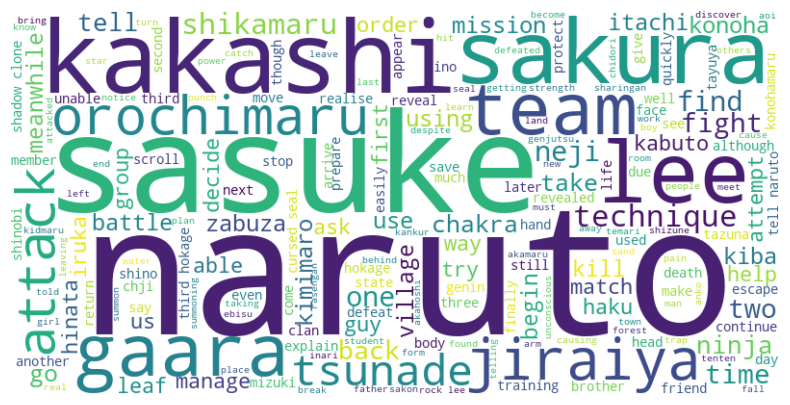

In [23]:
# Assuming 'season1' is a list of strings
season1_text = ' '.join(season1)

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(season1_text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


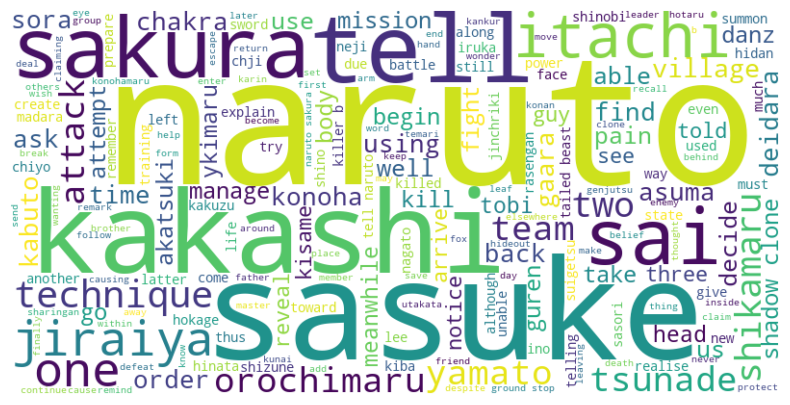

In [24]:
# Assuming 'season1' is a list of strings
season2_text = ' '.join(season2)

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(season2_text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


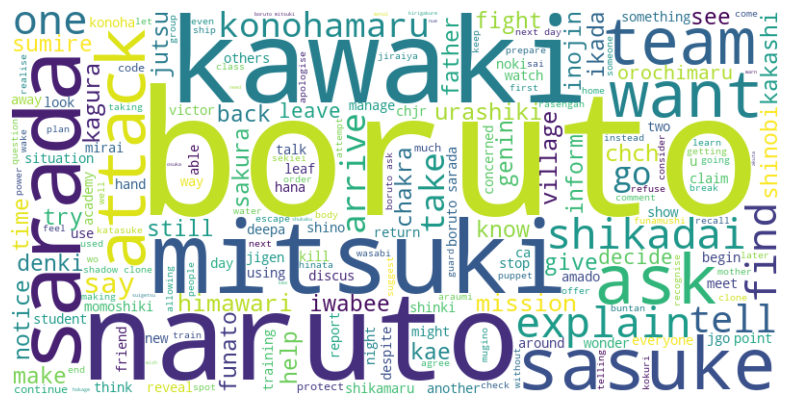

In [25]:
# Assuming 'season1' is a list of strings
season3_text = ' '.join(season3)

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(season3_text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


## Characther analysis

In [26]:
# Specify the path to your JSON file
json_file_path_characther_text = '/Users/lukasjonsson/Desktop/DTU/Kandidat/3. semester/Social graphs & interactions/Project/socialGraphsProject/data/characters_texts.json'

# Open the file and load its contents as a dictionary
with open(json_file_path_characther_text, 'r') as file:
    characters_text = json.load(file)

In [27]:
characters_text

{'Agara': ['Agara (アガラ) was a chūnin of Takigakure.',
  'Agara had a short crop of spiky black hair and small black eyes.',
  "Kabuto ambushing Agara's squad.",
  "Agara was on a mission with two other Takigakure shinobi when Kabuto Yakushi infiltrated their ranks. He and his cell-mates then began to chase after him. Afterwards, Agara was attacked and had his neck snapped by Kabuto so that the latter could test his new powers. When Anko Mitarashi found his body, it led her to the Mountains' Graveyard.[1]"],
 'A_(Fourth_Raikage)': ['',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  'A (エー, Ē, Viz: Ei, English TV: Ay) is the Fourth Raikage (四代目雷影, Yondaime Raikage, literally meaning: Fourth Lightning Shadow) of Kumogakure.',
  'A in his younger years alongside his brother.',
  "A is the son of the Third Raikage, who groomed him for the position of the Fourth Raikage.[3] At some point in the past, due to A not having a blood sibling who could b

In [28]:
from nltk.tokenize import word_tokenize

# Assuming 'final_dict_with_combined_descriptions' is your dictionary with combined Episode Descriptions
# Assuming 'labmt' is your LabMT wordlist dictionary

# Create a dictionary to store sentiment scores for each arc
sentiment_scores = {}

# Define a function to calculate the sentiment score
def calculate_sentiment(description, word_scores):
    # Ensure that description is a string
    description_str = ' '.join(description) if isinstance(description, list) else str(description)
    
    # Tokenize and lowercase
    tokens = word_tokenize(description_str.lower())
    
    # Calculate sentiment score based on LabMT wordlist
    sentiment_scores = [word_scores.get(token, 0) for token in tokens]
    
    if sentiment_scores:
        average_sentiment = sum(sentiment_scores) / len(sentiment_scores)
        return average_sentiment
    else:
        return None  # Return None if no valid tokens found

# Iterate through arcs in the dictionary
for character_name, combined_description in characters_text.items():
    # Calculate sentiment score based on LabMT wordlist
    sentiment_scores[character_name] = calculate_sentiment(combined_description, labmt)

# Print or use the sentiment scores as needed
for character_name, score in sentiment_scores.items():
    print(f"Character: {character_name}, Sentiment Score: {score}")

# If you want to save the sentiment scores to a file (e.g., sentiment_scores.json)
# with open('sentiment_scores.json', 'w') as file:
#     json.dump(sentiment_scores, file)


Character: Agara, Sentiment Score: 3.30060606060606
Character: A_(Fourth_Raikage), Sentiment Score: 3.832910717087712
Character: A_(Third_Raikage), Sentiment Score: 3.729996061441488
Character: Amagi, Sentiment Score: 3.6714214463840444
Character: Agari_Kaisen, Sentiment Score: 3.6490361445783135
Character: Amado_Sanzu, Sentiment Score: 3.810792682926815
Character: Akkun, Sentiment Score: 3.933563829787236
Character: Akahoshi, Sentiment Score: 3.8610009442870523
Character: Aho_Bird, Sentiment Score: 3.2290243902439033
Character: Agari, Sentiment Score: 4.316637931034483
Character: Ahiko, Sentiment Score: 3.768048780487805
Character: Akita_Inuzuka, Sentiment Score: 3.9234221311475443
Character: A_(Second_Raikage), Sentiment Score: 3.640134003350088
Character: A_(First_Raikage), Sentiment Score: 3.637026548672568
Character: Abiru, Sentiment Score: 3.789906542056076
Character: Amachi, Sentiment Score: 3.7765217391304367
Character: Akio, Sentiment Score: 4.113595505617979
Character: Akane_

In [29]:
s = calculate_sentiment('He would do whatever it took to gain power and a higher status', labmt)
s

5.501538461538463

In [30]:
# Assuming 'sentiment_scores' is your dictionary with arc names and scores

# Find the arc with the maximum sentiment score
max_charachter = max(sentiment_scores, key=sentiment_scores.get)
max_score = sentiment_scores[max_charachter]

# Find the arc with the minimum sentiment score
min_charachter = min(sentiment_scores, key=sentiment_scores.get)
min_score = sentiment_scores[min_charachter]

# Print or use the max and min sentiment scores
print(f"Max Sentiment: Characther: {max_charachter}, Score: {max_score}")
print(f"Min Sentiment: Characther: {min_charachter}, Score: {min_score}")

# If you want to save the max and min sentiment scores to a file (e.g., max_min_sentiment.json)
# with open('max_min_sentiment.json', 'w') as file:
#     json.dump({'max': {'arc': max_arc, 'score': max_score}, 'min': {'arc': min_arc, 'score': min_score}}, file, indent=2)


Max Sentiment: Characther: Sound_Daimyō, Score: 4.682298850574713
Min Sentiment: Characther: Zetsu, Score: 2.4963636363636366


In [31]:
import pandas as pd

# Assuming 'sentiment_scores' is your dictionary
df_characters = pd.DataFrame(list(sentiment_scores.items()), columns=['Character', 'Sentiment Score'])

# Print or use the DataFrame as needed
print(df_characters)


               Character  Sentiment Score
0                  Agara         3.300606
1     A_(Fourth_Raikage)         3.832911
2      A_(Third_Raikage)         3.729996
3                  Amagi         3.671421
4           Agari_Kaisen         3.649036
...                  ...              ...
1443               Ōnoki         3.833309
1444                Ōkei         2.958400
1445            Zenigoke         3.130543
1446              Ōwashi         4.183622
1447               Ōtora         3.878971

[1448 rows x 2 columns]


In [32]:
# Filter rows with a score lower than 3
df_characters[df_characters['Sentiment Score'] <3]


,Character,Sentiment Score
261,Gamaden,2.994194
716,Koshō,2.716500
1080,Satō,2.716500
1118,Shio,2.890390
1151,Soegi,2.773333
1433,Zetsu,2.496364
1444,Ōkei,2.958400


In [33]:
# Filter rows with a score higher than 4
df_characters[df_characters['Sentiment Score'] > 4.5]


,Character,Sentiment Score
788,Makino,4.550570
1165,Sound_Daimyō,4.682299
